# Apple Twitter Sentiment Analysis

<div style="text-align: center;" style="border: 2px solid black;">
    <img src="image/tweet.jpg" alt="Twitter Sentiment">
</div>

## Team Members

- [Goknur Kaya](https://www.linkedin.com/in/goknurk/) - Tech Lead

- [Andreas Budhi](https://www.linkedin.com/in/andreasbudhi/) - Github Lead

- [Andrew Hushcha](https://www.linkedin.com/in/andrew-hushcha/) - Presentation Lead

## Business Problem

Conducting a comprehensive sentiment analysis on Twitter's 2013 SXSW dataset, our objective is to discern the sentiments surrounding Apple products. This initiative seeks to gain insights into the perceptions and opinions expressed by Twitter users regarding Apple.

Key Focus Areas:

- Through meticulous analysis of Twitter data, our aim is to elevate the visibility and stature of the Apple brand by understanding and responding to the sentiments expressed on the platform.

- We aspire to develop an efficient model for continuous monitoring, ensuring timely responses to online discussions concerning our client's products. This proactive approach will foster engagement and maintain a positive online presence.


## Data Understanding

The dataset of 9092 tweets during South by Southwest (SXSW) 2013 which consists of google and apple sentiments.
 
We used a dataset from data.world provided by CrowdFlower which contains 9,093 tweets about Apple and Google from the South by Southwest (SXSW) Conference. The tweet categorizations include positive, negative, and neutral emotions. These labels correspond to the specific product, service, or company to which the expressed emotion is directed, determined by the content of the tweets.

## Filtering

- We filtered our dataset only for Apple products.
- Focused on positive and negative emotion.
- Since our dataset was not balanced between positive and negative emotion, we randomly selected 400 positive tweets to match with negative tweets.

## Data Limitations

- Outdated data.
- Imbalanced target’s classes.
- Limited representation of companies’ customers.

In [5]:
# Import Packages

import re
import nltk
import string

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator
from wordcloud import WordCloud

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize, RegexpTokenizer
from nltk.corpus import stopwords

from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, cross_val_predict
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, precision_score, f1_score, recall_score, roc_curve,roc_auc_score
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from PIL import Image

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to /Users/dre/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/dre/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/dre/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [7]:
# Reading in the Data
df= pd.read_csv("data/tweets.csv", encoding='latin')

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9093 entries, 0 to 9092
Data columns (total 3 columns):
 #   Column                                              Non-Null Count  Dtype 
---  ------                                              --------------  ----- 
 0   tweet_text                                          9092 non-null   object
 1   emotion_in_tweet_is_directed_at                     3291 non-null   object
 2   is_there_an_emotion_directed_at_a_brand_or_product  9093 non-null   object
dtypes: object(3)
memory usage: 213.2+ KB


# Data Cleaning and Feature Engineering

In [9]:
df.columns = ['tweet', 'brand', 'emotion']  # Changing the name of the columns

In [10]:
df['emotion'].value_counts()

emotion
No emotion toward brand or product    5389
Positive emotion                      2978
Negative emotion                       570
I can't tell                           156
Name: count, dtype: int64

In [11]:
# Mapping original emotion labels to new labels using a dictionary
emotion_dict = {
    'No emotion toward brand or product': 'neutral',
    'Positive emotion': 'positive',
    'Negative emotion': 'negative',
    "I can't tell": 'unknown'
}

# Applying the mapping to the 'emotion' column in the DataFrame
df['emotion'] = df['emotion'].map(emotion_dict)

In [12]:
# Filtering rows where the 'emotion' column is not equal to 'unknown'
df = df[df['emotion'] != 'unknown'] 

In [13]:
df['emotion'].value_counts()

emotion
neutral     5389
positive    2978
negative     570
Name: count, dtype: int64

In [14]:
# Applying a lambda function to convert string values to lowercase
df = df.apply(lambda x: x.str.lower() if x.dtype == "object" else x)

In [15]:
df.head()

,tweet,brand,emotion
0,.@wesley83 i have a 3g iphone. after 3 hrs twe...,iphone,negative
1,@jessedee know about @fludapp ? awesome ipad/i...,ipad or iphone app,positive
2,@swonderlin can not wait for #ipad 2 also. the...,ipad,positive
3,@sxsw i hope this year's festival isn't as cra...,ipad or iphone app,negative
4,@sxtxstate great stuff on fri #sxsw: marissa m...,google,positive


In [16]:
df = df.fillna('no_data')

In [17]:
def brand(row):
    """
    Categorizes or updates the 'brand_updated' column based on keywords in the 'tweet' column.

    Parameters:
    - row (pd.Series): A row of a Pandas DataFrame representing a tweet.

    Returns:
    - str: Updated brand category ('app', 'ipad', 'iphone', 'apple') or the original 'brand' value.
    """
    if 'ipad' in row['tweet'] and 'app' in row['tweet']:
        return 'app'
    elif 'iphone' in row['tweet'] and 'app' in row['tweet']:
        return 'app'
    elif 'itunes' in row['tweet']:
        return 'app'
    elif 'ipad' in row['tweet']:
        return 'ipad'
    elif 'iphone' in row['tweet']:
        return 'iphone'
    elif 'apple' in row['tweet']:
        return 'apple'
    else:
        return row['brand']

# Applying the brand function to create a new 'brand_updated' column
df['brand_updated'] = df.apply(brand, axis=1)

In [18]:
# Replacing values in the 'brand_updated' column
df['brand_updated'] = df['brand_updated'].replace({'ipad or iphone app': 'app', 
                                          'other apple product or service': 'apple'})

In [19]:
# List of Google-related values
google = ['android', 'android app', 'other google product or service', 'google', 'no_data']

# Filtering rows where 'brand_updated' is not in the Google-related values
df = df[~df['brand_updated'].isin(google)]

In [20]:
# Creating a new DataFrame 'apple' by dropping the 'brand' column from the original DataFrame 'df'
apple = df.drop('brand', axis=1)

# Preprocessing

In [21]:
# Remove Punctuation

def remove_punctuation(tweet_list):
    translator = str.maketrans('', '', string.punctuation)
    return tweet_list.translate(translator)

apple['tweet'] = apple['tweet'].apply(remove_punctuation)
apple.head()

,tweet,emotion,brand_updated
0,wesley83 i have a 3g iphone after 3 hrs tweeti...,negative,iphone
1,jessedee know about fludapp awesome ipadiphon...,positive,app
2,swonderlin can not wait for ipad 2 also they s...,positive,ipad
3,sxsw i hope this years festival isnt as crashy...,negative,app
5,teachntech00 new ipad apps for speechtherapy a...,neutral,app


In [22]:
# Remove Numerals

def remove_numerals(tweet_list):
    return re.sub(r'\d', '', tweet_list)

apple['tweet'] = apple['tweet'].apply(remove_numerals)
apple.head()

,tweet,emotion,brand_updated
0,wesley i have a g iphone after hrs tweeting a...,negative,iphone
1,jessedee know about fludapp awesome ipadiphon...,positive,app
2,swonderlin can not wait for ipad also they sh...,positive,ipad
3,sxsw i hope this years festival isnt as crashy...,negative,app
5,teachntech new ipad apps for speechtherapy and...,neutral,app


In [23]:
# Tokenization

token_pattern = r'(?:(?<![#@])\b\w+\b)|(?:\b\$[\d.]+\b)|(?:(?<![@])\S+)'

tokenizer = RegexpTokenizer(token_pattern)

apple['tweet_text_tokenized'] = apple['tweet'].apply(tokenizer.tokenize)
apple.head()

,tweet,emotion,brand_updated,tweet_text_tokenized
0,wesley i have a g iphone after hrs tweeting a...,negative,iphone,"[wesley, i, have, a, g, iphone, after, hrs, tw..."
1,jessedee know about fludapp awesome ipadiphon...,positive,app,"[jessedee, know, about, fludapp, awesome, ipad..."
2,swonderlin can not wait for ipad also they sh...,positive,ipad,"[swonderlin, can, not, wait, for, ipad, also, ..."
3,sxsw i hope this years festival isnt as crashy...,negative,app,"[sxsw, i, hope, this, years, festival, isnt, a..."
5,teachntech new ipad apps for speechtherapy and...,neutral,app,"[teachntech, new, ipad, apps, for, speechthera..."


In [24]:
# Remove Stopwords

stopwords_list = stopwords.words('english')
stopwords_list.extend(['sxsw', 'sxswi', 'sxswers', 'mention', 'link', 'rt', 'austin', 
                       'riseaustin', 'haha', 'isnt', 'ûïmention', 'didnt', 'doesnt', 
                       'dont', 'quoti', 'japan', 'amp', 'go', 'one', 'line', 'say', 'look', 'im',
                       'ipad', 'iphone', 'app', 'store', 'apple', 'android', 'downtown'])

def remove_stopwords(tweet_list):
    stopword_cleanup = [tweet for tweet in tweet_list if tweet not in stopwords_list]
    return stopword_cleanup

apple['tweet_text_tokenized'] = apple['tweet_text_tokenized'].apply(remove_stopwords)
apple.head()

,tweet,emotion,brand_updated,tweet_text_tokenized
0,wesley i have a g iphone after hrs tweeting a...,negative,iphone,"[wesley, g, hrs, tweeting, dead, need, upgrade..."
1,jessedee know about fludapp awesome ipadiphon...,positive,app,"[jessedee, know, fludapp, awesome, ipadiphone,..."
2,swonderlin can not wait for ipad also they sh...,positive,ipad,"[swonderlin, wait, also, sale]"
3,sxsw i hope this years festival isnt as crashy...,negative,app,"[hope, years, festival, crashy, years]"
5,teachntech new ipad apps for speechtherapy and...,neutral,app,"[teachntech, new, apps, speechtherapy, communi..."


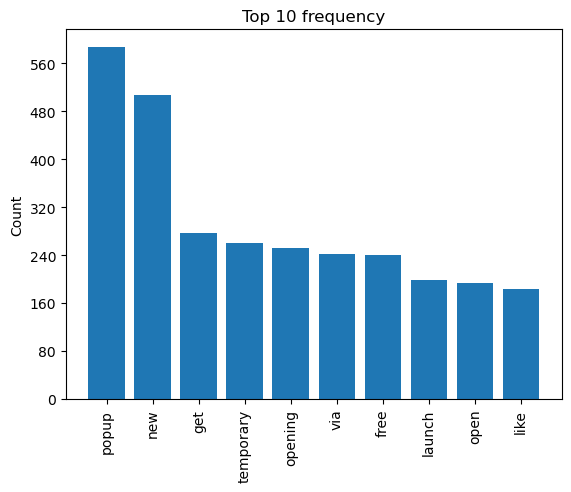

In [25]:
def visualize_top_10(freq_dist, title):

    # Extract data for plotting
    top_10 = list(zip(*freq_dist.most_common(10)))
    tokens = top_10[0]
    counts = top_10[1]

    # Set up plot and plot data
    fig, ax = plt.subplots()
    ax.bar(tokens, counts)

    # Customize plot appearance
    ax.set_title(title)
    ax.set_ylabel("Count")
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.tick_params(axis="x", rotation=90)

tweet_freq_dist = FreqDist(apple['tweet_text_tokenized'].explode())

visualize_top_10(tweet_freq_dist, "Top 10 frequency")

- As we see above, top 10 frequency words, people are excited about new apple product launch. Popup, new, launch are the most mention words.

# Lemmatizing

In [26]:
# Creating a WordNetLemmatizer instance
lemmatizer = WordNetLemmatizer()

def lemmatize_tweets(tweet_list):
    """
    Lemmatizes a list of words using the WordNetLemmatizer.

    Parameters:
    - tweet_list (list): List of words to be lemmatized.

    Returns:
    - list: List of lemmatized words.
    """
    return [lemmatizer.lemmatize(tweet) for tweet in tweet_list]

# Applying the lemmatize_tweets function to the 'tweet_text_tokenized' column
apple['tweet_text_tokenized'] = apple['tweet_text_tokenized'].apply(lemmatize_tweets)

## WordCloud Visualization

- We want to see word clouds for positive, negative and neutral sentiments to see what words has been mentioned more

In [27]:
# Converting tokenized tweets into text

apple['tweet_clean'] = apple['tweet_text_tokenized'].apply(lambda tweets: ' '.join(tweets))

### WordCloud Ipad

In [28]:
# Loading the image and creating a NumPy array
mask = np.array(Image.open('image/apple_white.png'))

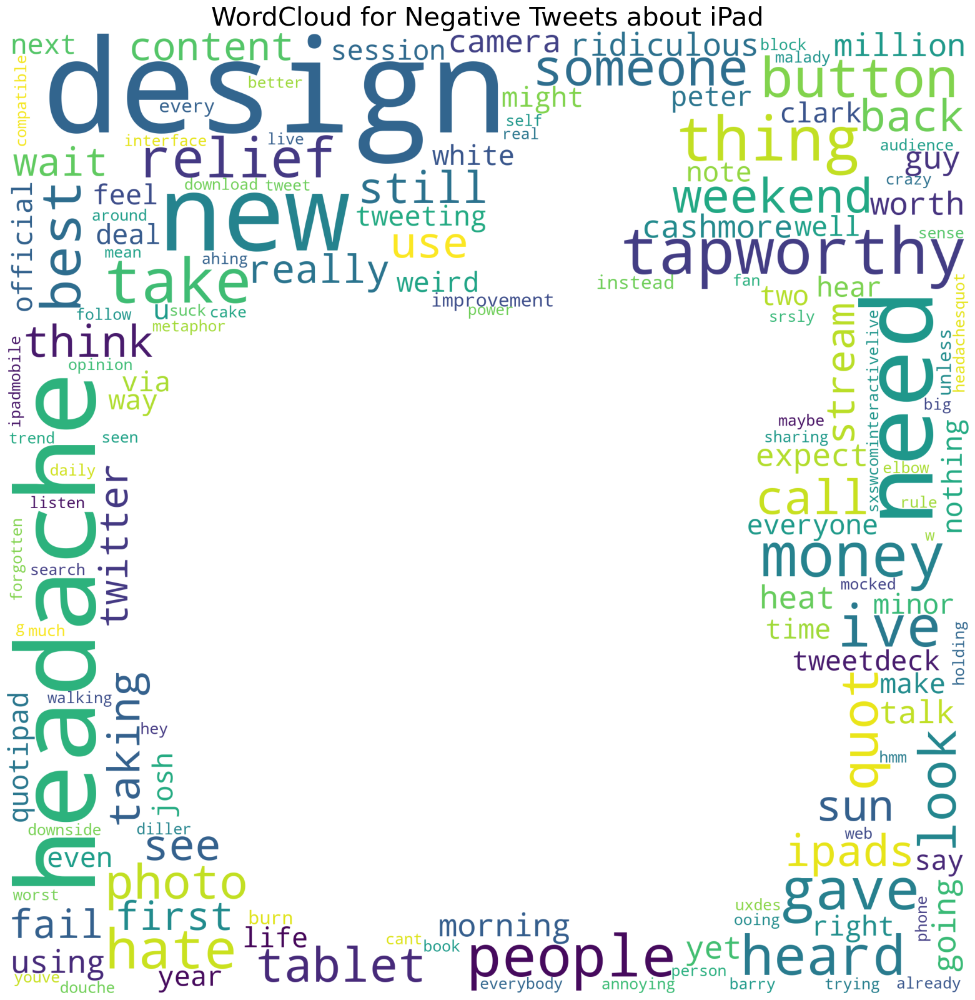

In [29]:
# Selecting negative tweets about iPad from the 'apple' DataFrame
data = apple.loc[(apple['emotion'] == 'negative') & (apple['brand_updated'] == 'ipad'), 'tweet_clean'][:4000]

# Setting up the figure size
plt.figure(figsize=(20,20))

# Creating a WordCloud with specific parameters
wc = WordCloud(max_words=150, width=1600, height=800, collocations=False, background_color='white', mask=mask).generate(" ".join(data))

# Plotting the WordCloud
plt.title("WordCloud for Negative Tweets about iPad", size=30)
plt.axis('off')
plt.imshow(wc);

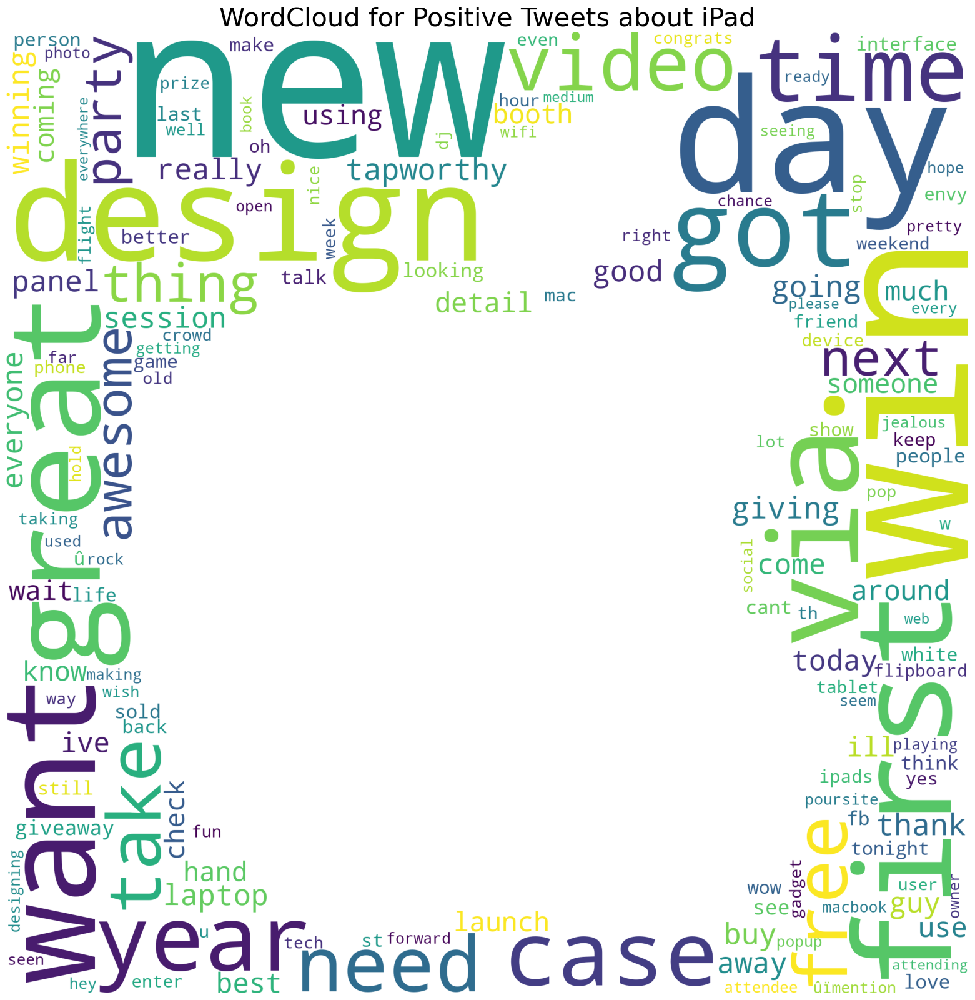

In [30]:
# Selecting positive tweets about iPad from the 'apple' DataFrame
data = apple.loc[(apple['emotion'] == 'positive') & (apple['brand_updated'] == 'ipad'), 'tweet_clean'][:4000]

# Setting up the figure size
plt.figure(figsize=(20,20))

# Creating a WordCloud with specific parameters
wc = WordCloud(max_words=150, width=1600, height=800, collocations=False, background_color='white', mask=mask).generate(" ".join(data))

# Plotting the WordCloud
plt.title("WordCloud for Positive Tweets about iPad", size=30)
plt.axis('off')
plt.imshow(wc);

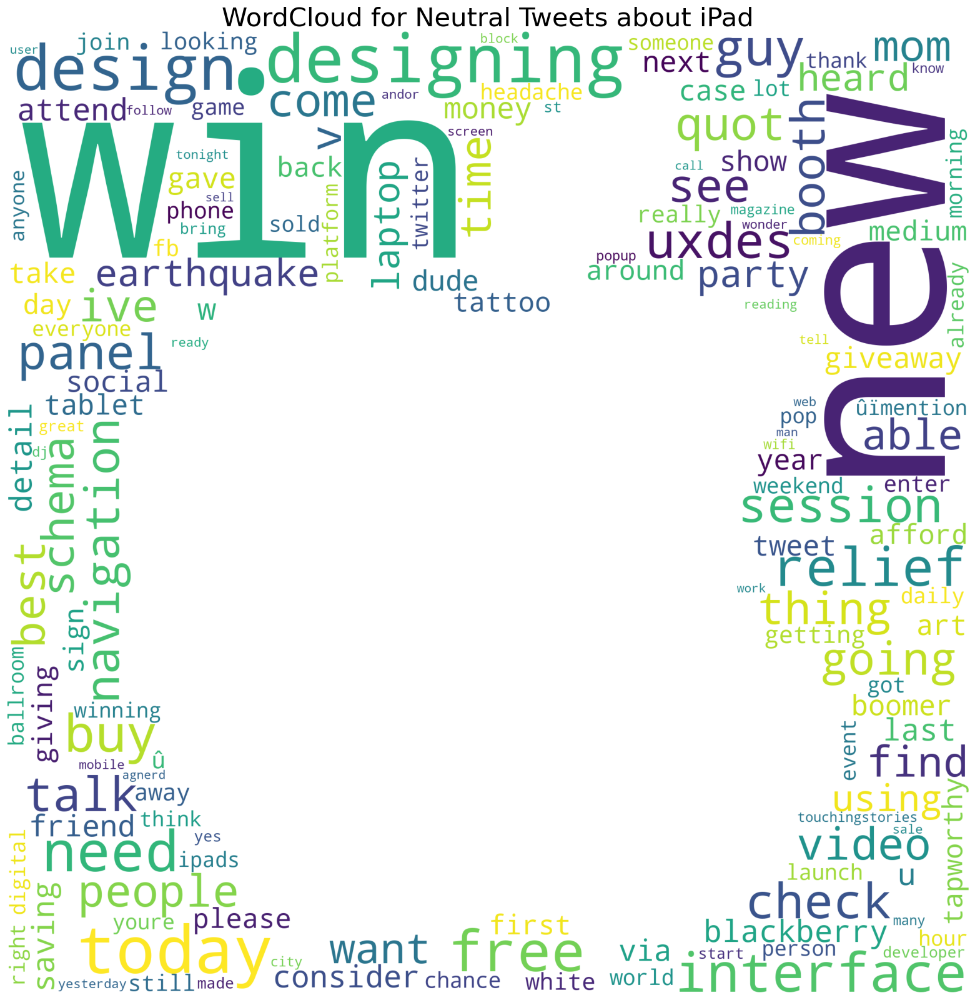

In [31]:
# Selecting neutral tweets about iPad from the 'apple' DataFrame
data = apple.loc[(apple['emotion'] == 'neutral') & (apple['brand_updated'] == 'ipad'), 'tweet_clean'][:4000]

# Setting up the figure size
plt.figure(figsize=(20,20))

# Creating a WordCloud with specific parameters
wc = WordCloud(max_words=150, width=1600, height=800, collocations=False, background_color='white', mask=mask).generate(" ".join(data))

# Plotting the WordCloud
plt.title("WordCloud for Neutral Tweets about iPad", size=30)
plt.axis('off')
plt.imshow(wc);

### WordCloud Iphone

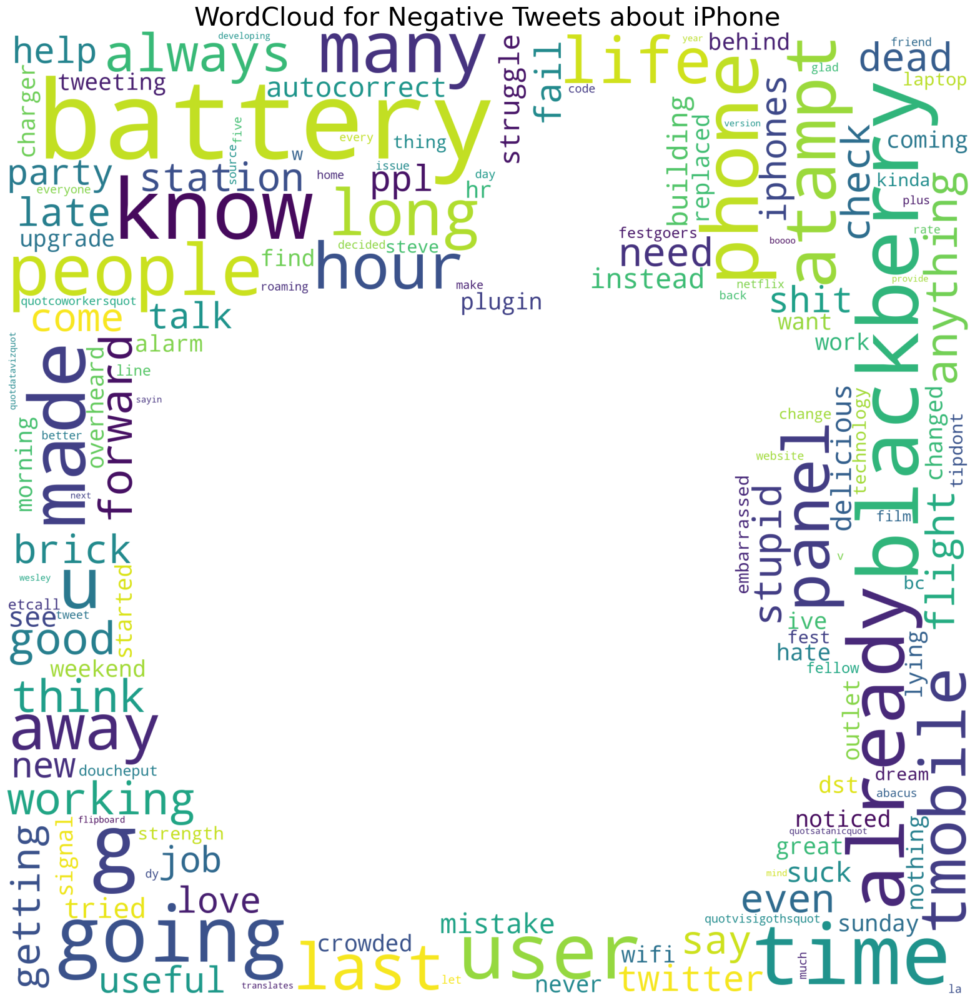

In [32]:
# Selecting negative tweets about iPhone from the 'apple' DataFrame
data = apple.loc[(apple['emotion'] == 'negative') & (apple['brand_updated'] == 'iphone'), 'tweet_clean'][:4000]

# Setting up the figure size
plt.figure(figsize=(20,20))

# Creating a WordCloud with specific parameters
wc = WordCloud(max_words=150, width=1600, height=800, collocations=False, background_color='white', mask=mask).generate(" ".join(data))

# Plotting the WordCloud
plt.title("WordCloud for Negative Tweets about iPhone", size=30)
plt.axis('off')
plt.imshow(wc);

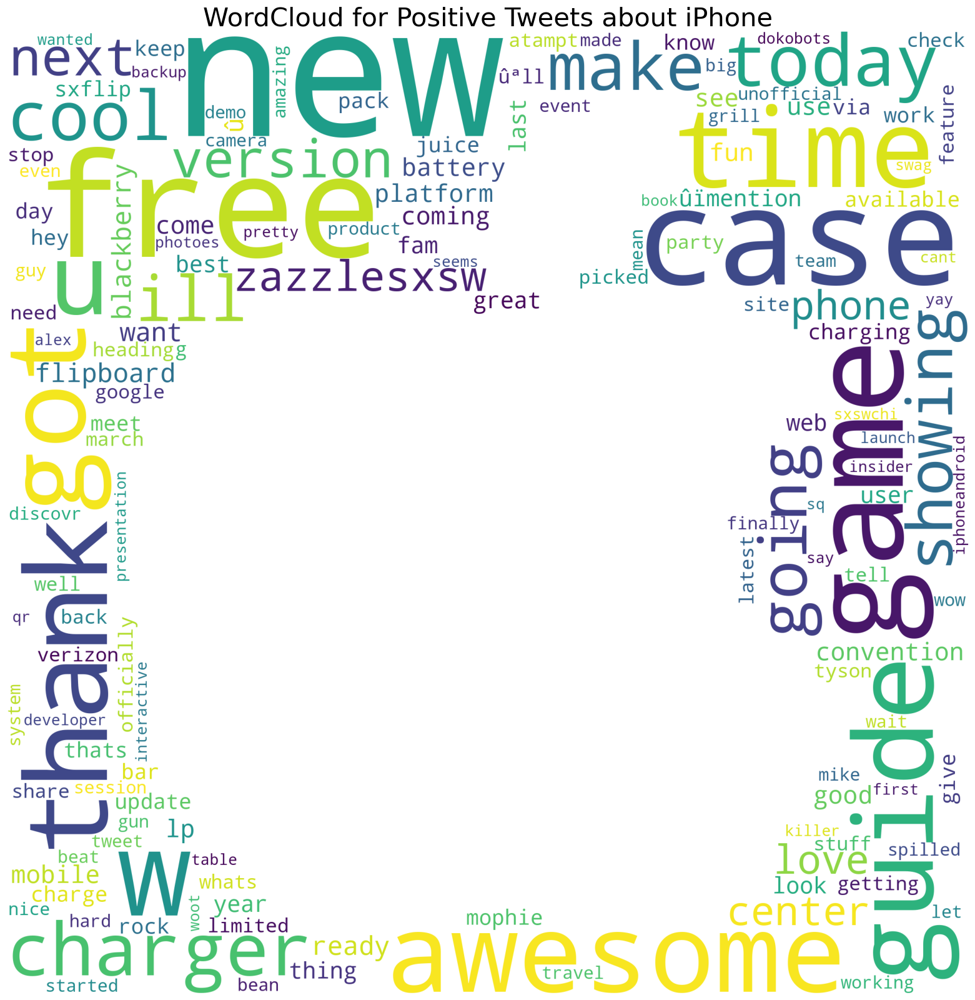

In [33]:
# Selecting positive tweets about iPhone from the 'apple' DataFrame
data = apple.loc[(apple['emotion'] == 'positive') & (apple['brand_updated'] == 'iphone'), 'tweet_clean'][:4000]

# Setting up the figure size
plt.figure(figsize=(20,20))

# Creating a WordCloud with specific parameters
wc = WordCloud(max_words=150, width=1600, height=800, collocations=False, background_color='white', mask=mask).generate(" ".join(data))

# Plotting the WordCloud
plt.title("WordCloud for Positive Tweets about iPhone", size=30)
plt.axis('off')
plt.imshow(wc);

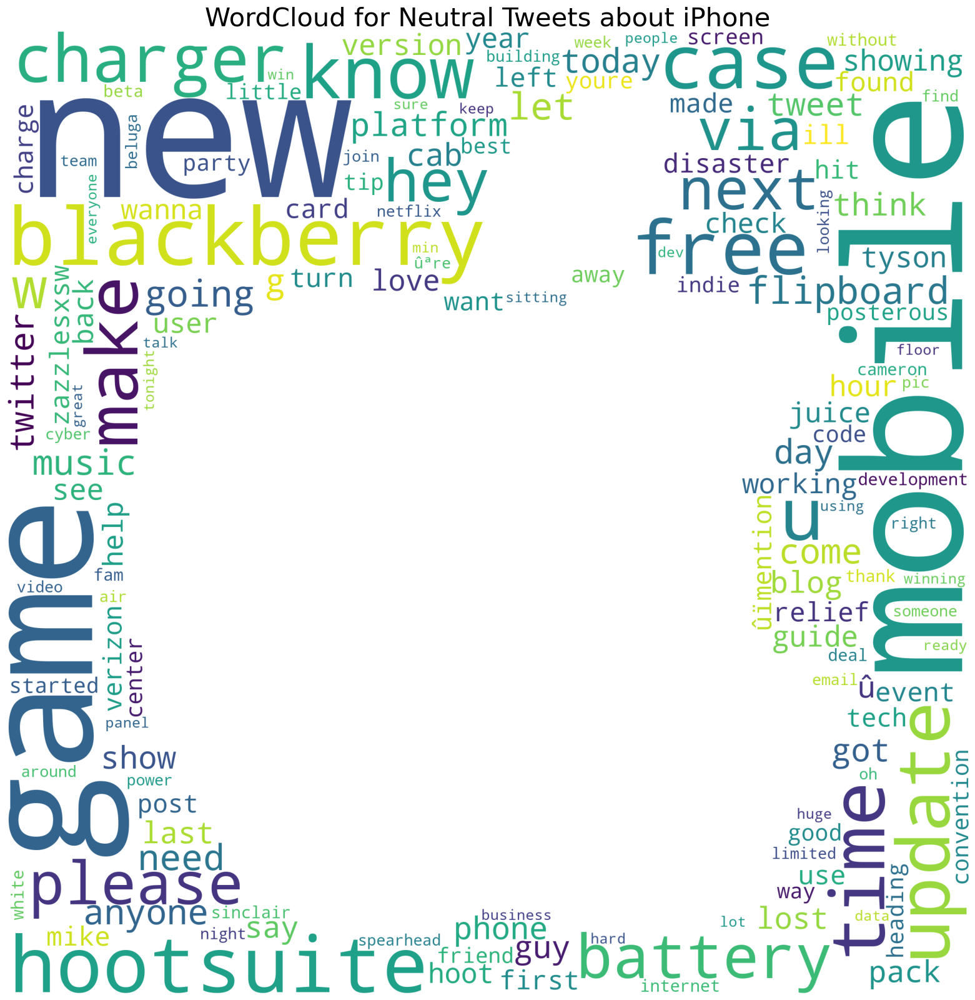

In [34]:
# Selecting neutral tweets about iPhone from the 'apple' DataFrame
data = apple.loc[(apple['emotion'] == 'neutral') & (apple['brand_updated'] == 'iphone'), 'tweet_clean'][:4000]

# Setting up the figure size
plt.figure(figsize=(20,20))

# Creating a WordCloud with specific parameters
wc = WordCloud(max_words=150, width=1600, height=800, collocations=False, background_color='white', mask=mask).generate(" ".join(data))

# Plotting the WordCloud
plt.title("WordCloud for Neutral Tweets about iPhone", size=30)
plt.axis('off')
plt.imshow(wc);

### WordCloud App

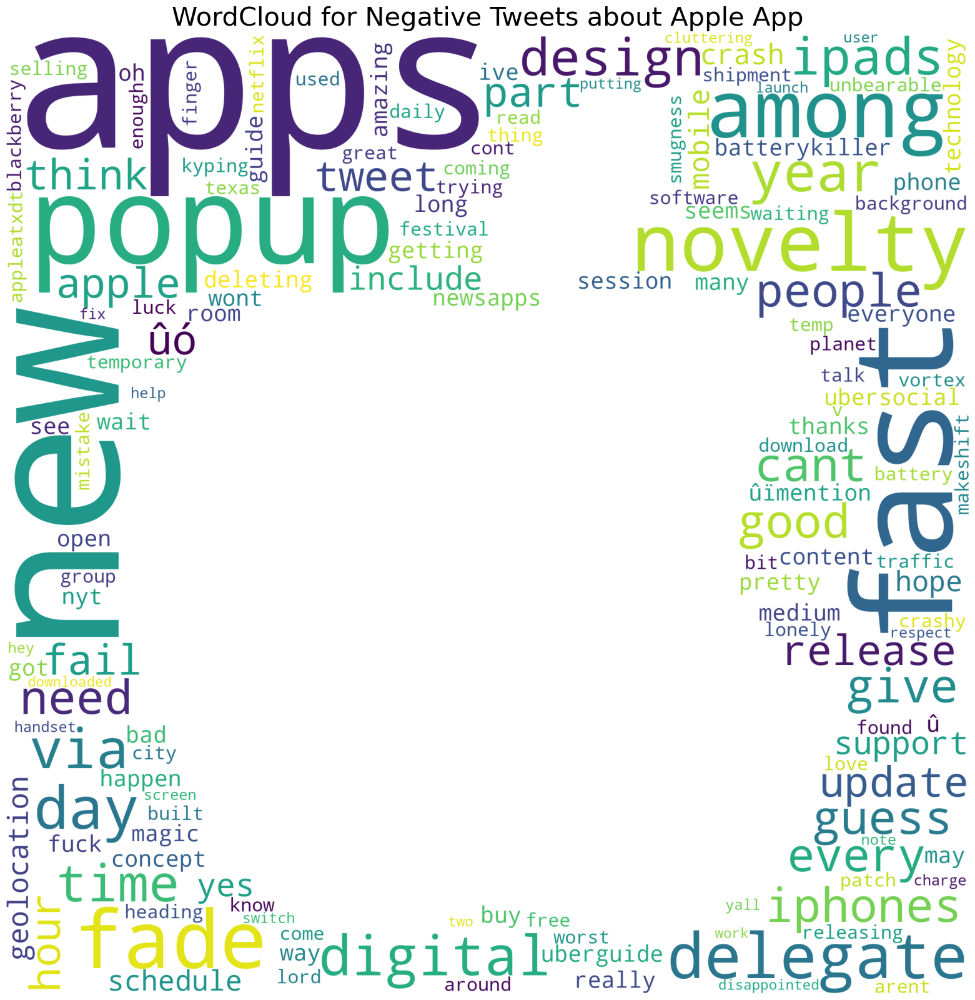

In [35]:
# Selecting negative tweets about Apple apps from the 'apple' DataFrame
data = apple.loc[(apple['emotion'] == 'negative') & (apple['brand_updated'] == 'app'), 'tweet_clean'][:4000]

# Setting up the figure size
plt.figure(figsize=(20,20))

# Creating a WordCloud with specific parameters
wc = WordCloud(max_words=150, width=1600, height=800, collocations=False, background_color='white', mask=mask).generate(" ".join(data))

# Plotting the WordCloud
plt.title("WordCloud for Negative Tweets about Apple App", size=30)
plt.axis('off')
plt.imshow(wc);

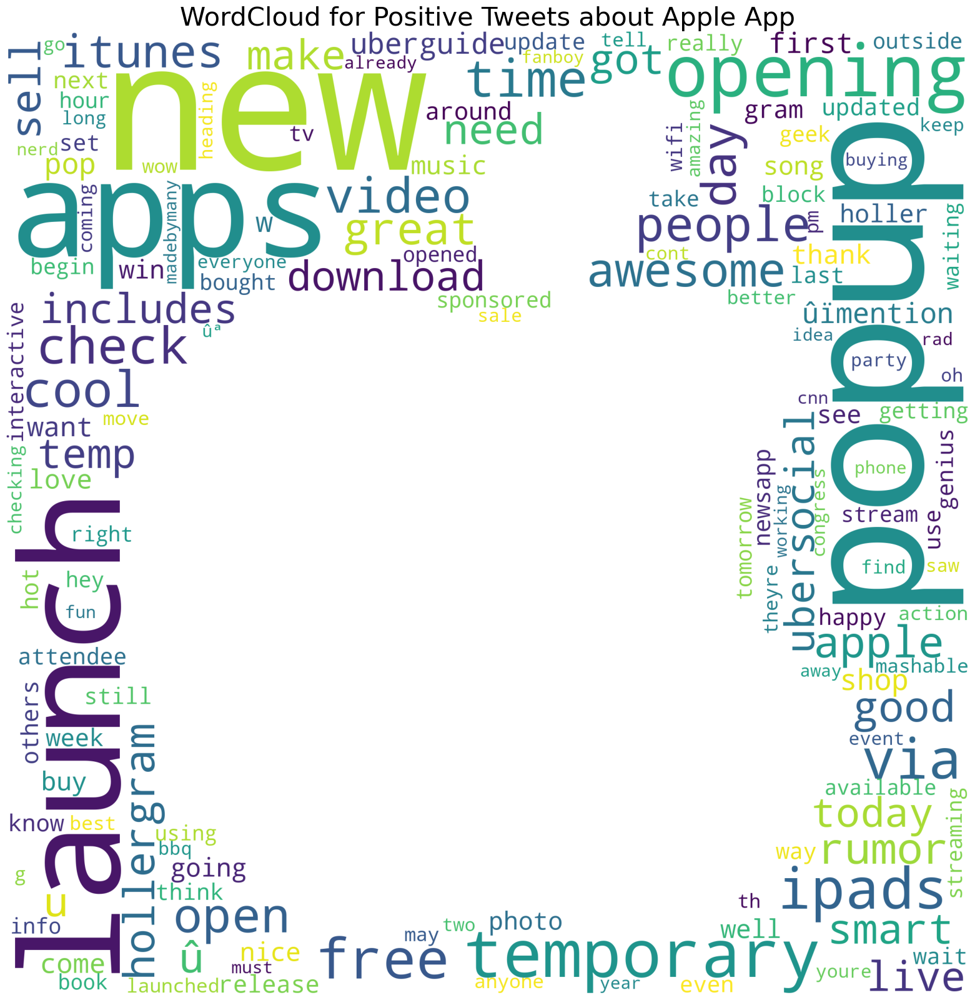

In [36]:
# Selecting positive tweets about Apple apps from the 'apple' DataFrame
data = apple.loc[(apple['emotion'] == 'positive') & (apple['brand_updated'] == 'app'), 'tweet_clean'][:4000]

# Setting up the figure size
plt.figure(figsize=(20,20))

# Creating a WordCloud with specific parameters
wc = WordCloud(max_words=150, width=1600, height=800, collocations=False, background_color='white', mask=mask).generate(" ".join(data))

# Plotting the WordCloud
plt.title("WordCloud for Positive Tweets about Apple App", size=30)
plt.axis('off')
plt.imshow(wc);

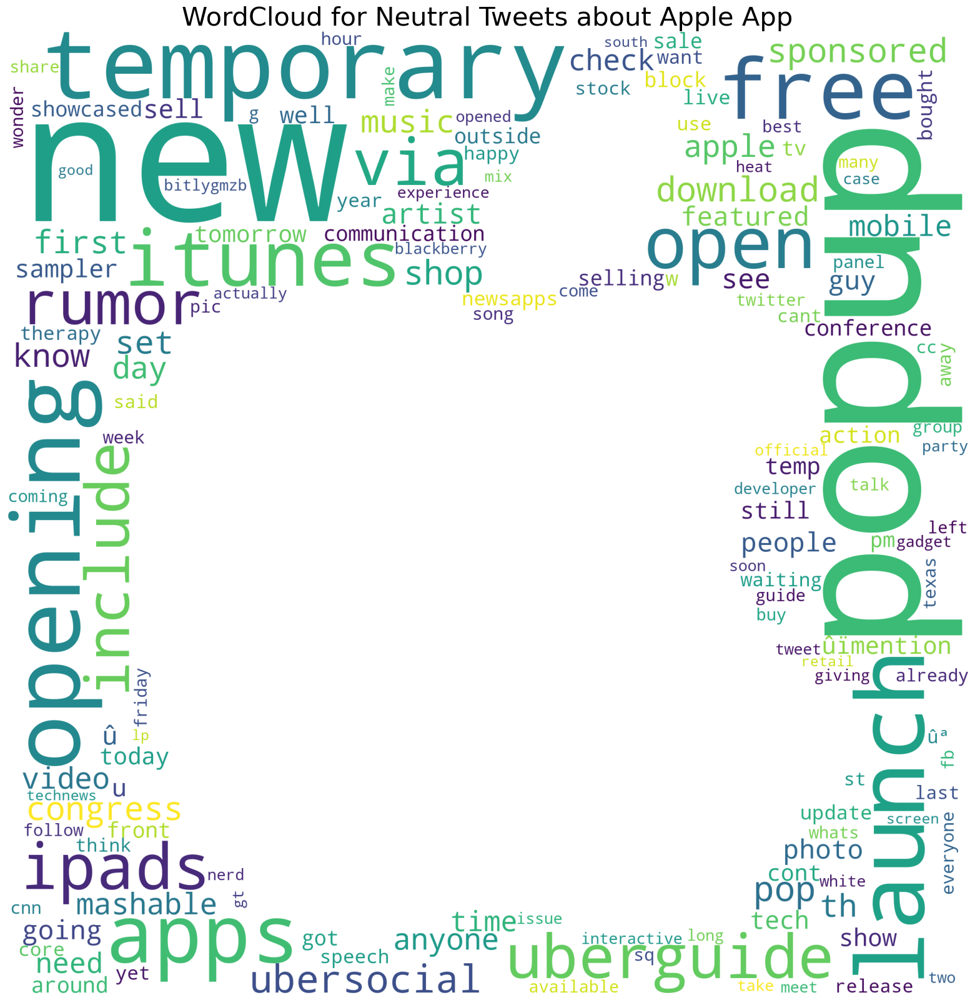

In [37]:
# Selecting neutral tweets about Apple apps from the 'apple' DataFrame
data = apple.loc[(apple['emotion'] == 'neutral') & (apple['brand_updated'] == 'app'), 'tweet_clean'][:4000]

# Setting up the figure size
plt.figure(figsize=(20,20))

# Creating a WordCloud with specific parameters
wc = WordCloud(max_words=150, width=1600, height=800, collocations=False, background_color='white', mask=mask).generate(" ".join(data))

# Plotting the WordCloud
plt.title("WordCloud for Neutral Tweets about Apple App", size=30)
plt.axis('off')
plt.imshow(wc);

### WordCloud Apple

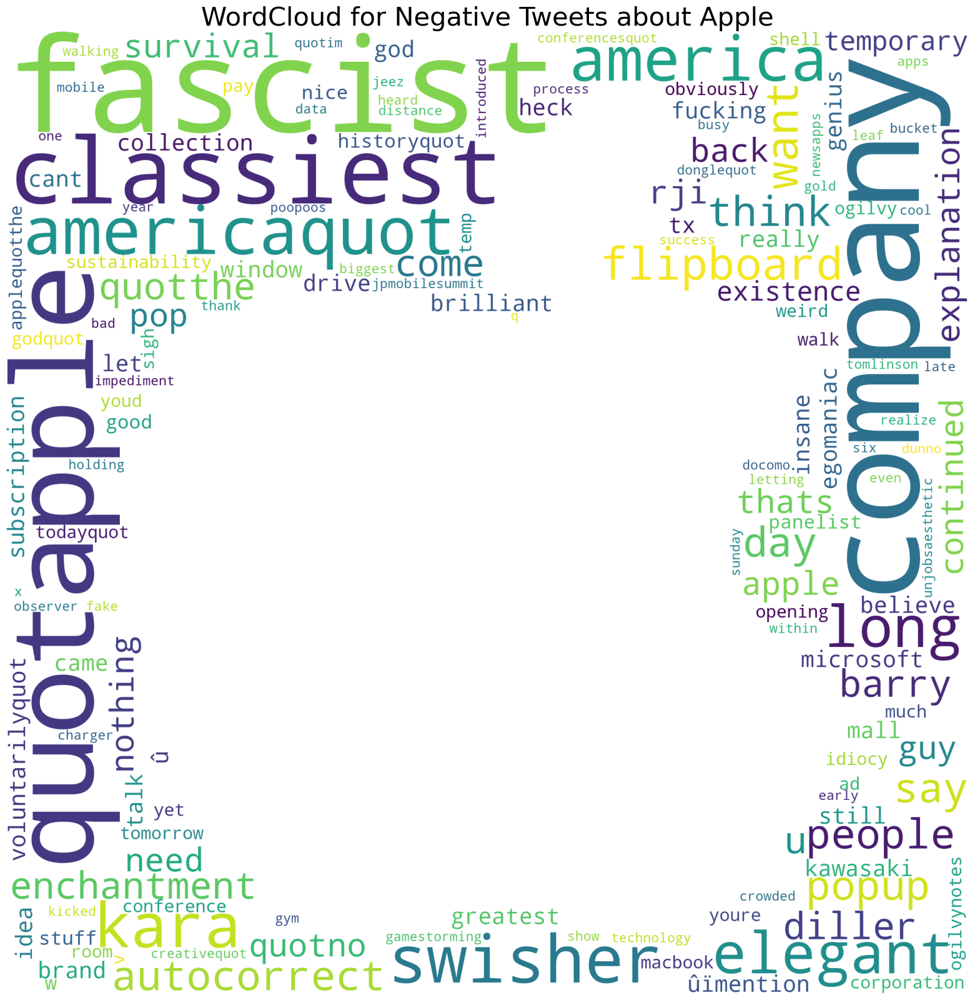

In [38]:
# Selecting negative tweets about Apple from the 'apple' DataFrame
data = apple.loc[(apple['emotion'] == 'negative') & (apple['brand_updated'] == 'apple'), 'tweet_clean'][:4000]

# Setting up the figure size
plt.figure(figsize=(20,20))

# Creating a WordCloud with specific parameters
wc = WordCloud(max_words=150, width=1600, height=800, collocations=False, background_color='white', mask=mask).generate(" ".join(data))

# Plotting the WordCloud
plt.title("WordCloud for Negative Tweets about Apple", size=30)
plt.axis('off')
plt.imshow(wc);

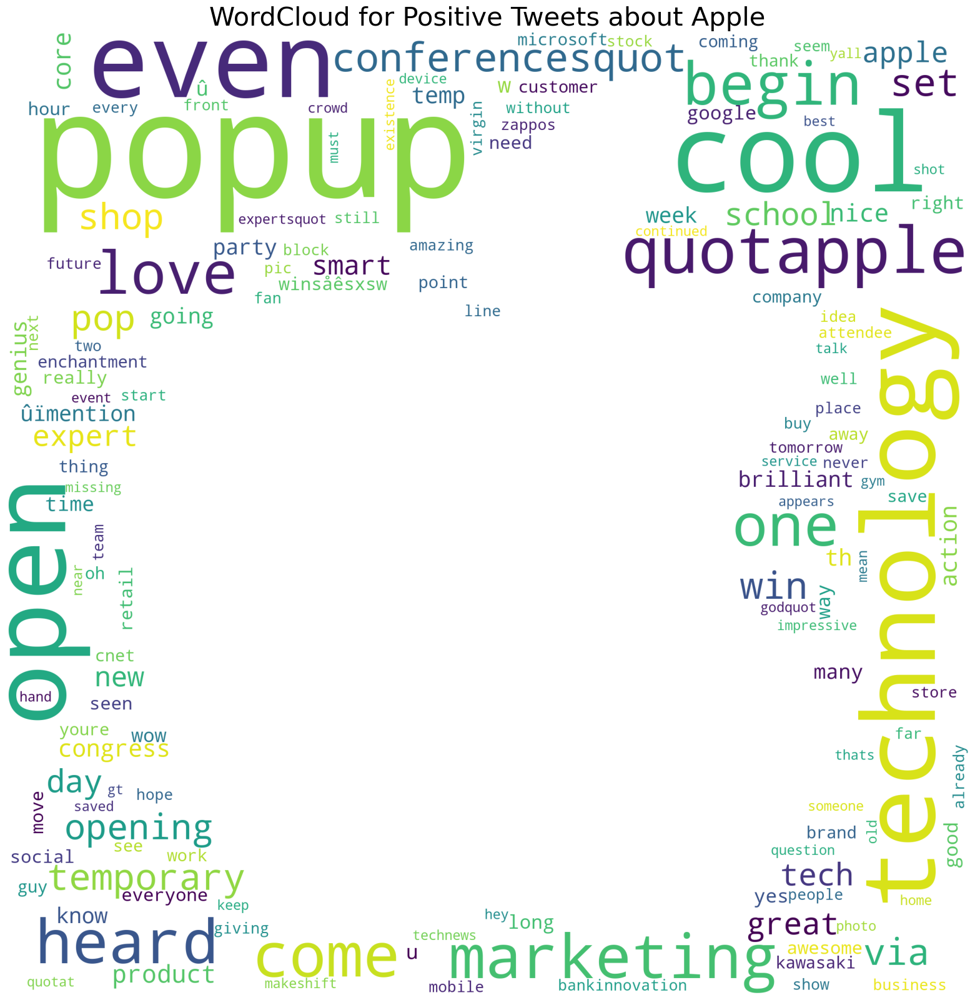

In [39]:
# Selecting positive tweets about Apple from the 'apple' DataFrame
data = apple.loc[(apple['emotion'] == 'positive') & (apple['brand_updated'] == 'apple'), 'tweet_clean'][:4000]

# Setting up the figure size
plt.figure(figsize=(20,20))

# Creating a WordCloud with specific parameters
wc = WordCloud(max_words=150, width=1600, height=800, collocations=False, background_color='white', mask=mask).generate(" ".join(data))

# Plotting the WordCloud
plt.title("WordCloud for Positive Tweets about Apple", size=30)
plt.axis('off')
plt.imshow(wc);

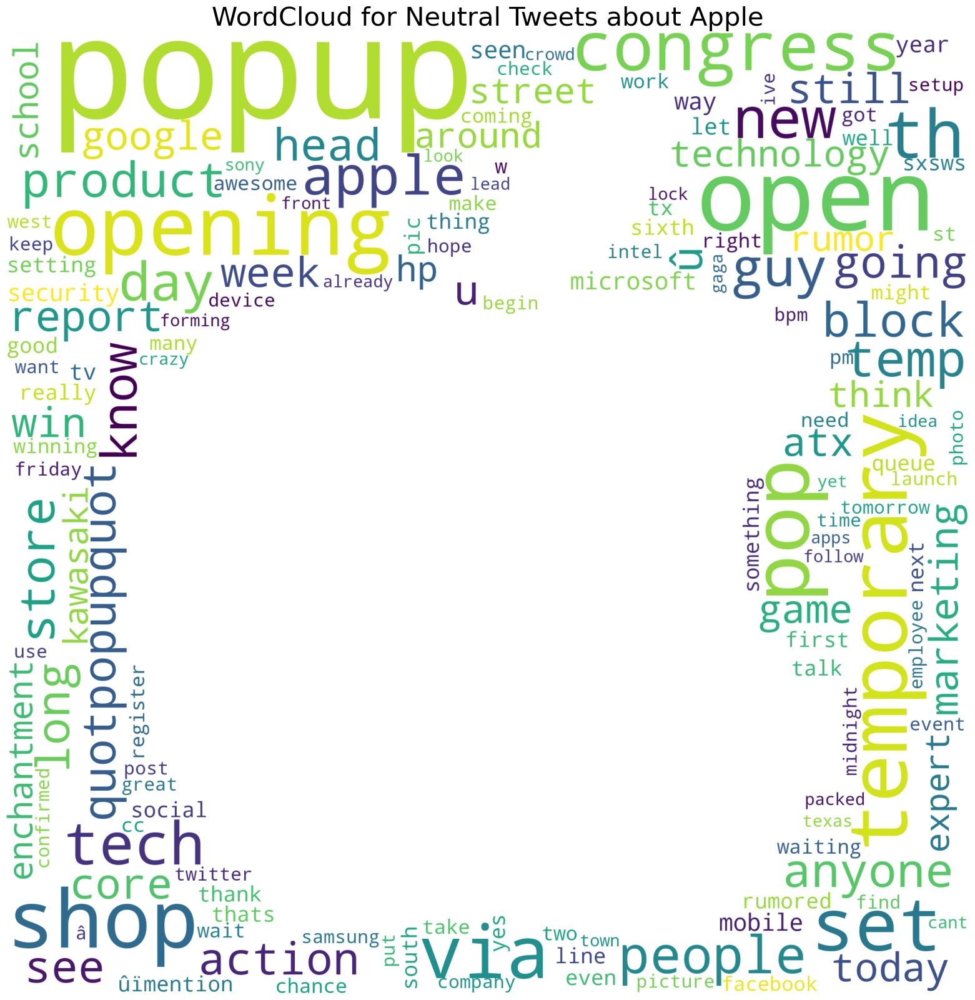

In [40]:
# Selecting neutral tweets about Apple from the 'apple' DataFrame
data = apple.loc[(apple['emotion'] == 'neutral') & (apple['brand_updated'] == 'apple'), 'tweet_clean'][:4000]

# Setting up the figure size
plt.figure(figsize=(20,20))

# Creating a WordCloud with specific parameters
wc = WordCloud(max_words=150, width=1600, height=800, collocations=False, background_color='white', mask=mask).generate(" ".join(data))

# Plotting the WordCloud
plt.title("WordCloud for Neutral Tweets about Apple", size=30)
plt.axis('off')
plt.imshow(wc);

# Randomly taking 400 positive tweets

- Since our dataset is imbalanced. We had to randomly select 400 tweets to match with negative sentiments to ensure our modeling will be accurate.

In [41]:
# Selecting positive tweets from the 'apple' DataFrame
positive_rows = apple.loc[apple['emotion'] == 'positive']

# Sampling 400 random positive tweets
random_positive_samples = positive_rows.sample(n=400, random_state=42)

# Displaying the first few rows of the random positive samples
random_positive_samples.head()

,tweet,emotion,brand_updated,tweet_text_tokenized,tweet_clean
4489,we all including me have this emotional thing ...,positive,ipad,"[including, emotional, thing, barrydiller, pnid]",including emotional thing barrydiller pnid
2679,then there is hope i too may someday keynote s...,positive,ipad,"[hope, may, someday, keynote, swsx, bored, key...",hope may someday keynote swsx bored keynote
3903,mention it is a good question amp for most bra...,positive,apple,"[good, question, brand, answer, probably, exce...",good question brand answer probably except cou...
7373,getting iphone juiced by the sonos team at sxs...,positive,app,"[getting, juiced, sonos, team, next, gotta, love]",getting juiced sonos team next gotta love
8728,yup showusyouricrazy rt mention apples popup s...,positive,app,"[yup, showusyouricrazy, apple, popup, day, rel...",yup showusyouricrazy apple popup day release c...


In [42]:
# Selecting all rows with negative emotion from the 'apple' DataFrame
remaining_negative_rows = apple.loc[apple['emotion'] == 'negative']

In [43]:
# Concatenating the random sample of positive tweets with the remaining negative rows
final_dataframe = pd.concat([random_positive_samples, remaining_negative_rows])

# Dropping specific columns from the final DataFrame
final_dataframe = final_dataframe.drop(columns=['tweet', 'brand_updated', 'tweet_clean'], axis=1)

# Displaying information about the final DataFrame
final_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
Index: 821 entries, 4489 to 9043
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   emotion               821 non-null    object
 1   tweet_text_tokenized  821 non-null    object
dtypes: object(2)
memory usage: 19.2+ KB


In [44]:
# Mapping 'negative' to 0 and 'positive' to 1 with LabelEncoder

label_encoder = LabelEncoder()

final_dataframe['encoded_target'] = label_encoder.fit_transform(final_dataframe['emotion'])

# Display the updated value counts
print(final_dataframe['emotion'].value_counts())

emotion
negative    421
positive    400
Name: count, dtype: int64


# Modeling

### Binary Target Column

Class 0 = negative
<br>
Class 1 = positive

In [45]:
# Assigning features and target variable
X = final_dataframe['tweet_text_tokenized']
y = final_dataframe['encoded_target']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Baseline Model

In [46]:
# Convert tokenized lists to strings for input to TfidfVectorizer
X_train_strings = [' '.join(tokens) for tokens in X_train]
X_test_strings = [' '.join(tokens) for tokens in X_test]

# Create a baseline Multinomial Naive Bayes pipeline
baseline_mnb = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('mnb', MultinomialNB())
])

# Cross-validate the baseline model on the training set
baseline_scores = cross_val_score(baseline_mnb, X_train_strings, y_train, cv=5, scoring="accuracy")

# Train the baseline model on the training set
baseline_mnb.fit(X_train_strings, y_train)

# Make predictions on the training and test sets
baseline_predict_train = cross_val_predict(baseline_mnb, X_train_strings, y_train, cv=5)
baseline_predict_test = cross_val_predict(baseline_mnb, X_test_strings, y_test, cv=5)

# Evaluate the performance of the baseline model
print("MNB accuracy on the train set:", round(accuracy_score(y_train, baseline_predict_train), 2))
print("MNB accuracy on the test set:", round(accuracy_score(y_test, baseline_predict_test), 2))
print("MNB F1 on the test set:", round(f1_score(y_test, baseline_predict_test), 2))

# Generate and display the classification report for the baseline model
report_baseline = classification_report(y_test, baseline_predict_test)
print(report_baseline)

MNB accuracy on the train set: 0.7
MNB accuracy on the test set: 0.75
MNB F1 on the test set: 0.73
              precision    recall  f1-score   support

           0       0.74      0.78      0.76        85
           1       0.75      0.71      0.73        80

    accuracy                           0.75       165
   macro avg       0.75      0.74      0.74       165
weighted avg       0.75      0.75      0.75       165



#### Multinomial Naive Bayes Model

In [47]:
# Create a pipeline with TF-IDF Vectorizer and Multinomial Naive Bayes
pipe_mnb = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('mnb', MultinomialNB())
])

# Define hyperparameter grid for GridSearchCV
param_grid_mnb = {
    'tfidf__max_features': [1000, 5000, 10000],
    'tfidf__ngram_range': [(1, 1), (1, 2)],
    'mnb__alpha': [0.1, 1.0, 10.0]
}

# Perform GridSearchCV
grid_search_mnb = GridSearchCV(pipe_mnb, param_grid_mnb, cv=5, n_jobs=-1)
grid_search_mnb.fit(X_train_strings, y_train)

# Print the best hyperparameters
print(f'Best hyperparameters: {grid_search_mnb.best_params_}')

# Best estimator
best_estimator_mnb = grid_search_mnb.best_estimator_

Best hyperparameters: {'mnb__alpha': 1.0, 'tfidf__max_features': 5000, 'tfidf__ngram_range': (1, 2)}


In [48]:
# Cross-validate the best MNB model on the training set
mnb_scores = cross_val_score(best_estimator_mnb, X_train_strings, y_train, cv=5, scoring="accuracy")

# Train the best MNB model on the training set
best_estimator_mnb.fit(X_train_strings, y_train)

# Make predictions on the training and test sets
mnb_predict_train = cross_val_predict(best_estimator_mnb, X_train_strings, y_train, cv=5)
mnb_predict_test = cross_val_predict(best_estimator_mnb, X_test_strings, y_test, cv=5)

# Evaluate the performance of the best MNB model
print("MNB accuracy on the train set:", round(accuracy_score(y_train, mnb_predict_train), 2))
print("MNB accuracy on the test set:", round(accuracy_score(y_test, mnb_predict_test), 2))
print("MNB F1 on the test set:", round(f1_score(y_test, mnb_predict_test), 2))

# Generate and display the classification report for the best MNB model
report_mnb = classification_report(y_test, mnb_predict_test)
print(report_mnb)

MNB accuracy on the train set: 0.7
MNB accuracy on the test set: 0.76
MNB F1 on the test set: 0.74
              precision    recall  f1-score   support

           0       0.74      0.82      0.78        85
           1       0.79      0.70      0.74        80

    accuracy                           0.76       165
   macro avg       0.77      0.76      0.76       165
weighted avg       0.77      0.76      0.76       165



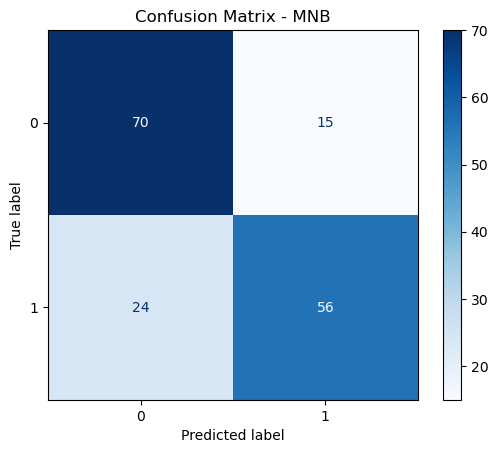

In [49]:
# Generate confusion matrix for the best MNB model
cm_mnb = confusion_matrix(y_test, mnb_predict_test)

# Create a ConfusionMatrixDisplay object
disp_mnb = ConfusionMatrixDisplay(confusion_matrix=cm_mnb)

# Plot the confusion matrix
disp_mnb.plot(cmap='Blues', values_format='d')

# Set the title for the confusion matrix plot
plt.title('Confusion Matrix - MNB')

# Show the plot
plt.show()


### Logistic Regression model

In [50]:
# Create a pipeline with TF-IDF Vectorizer and Logistic Regression
pipe_logreg = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('logreg', LogisticRegression(random_state=42))
])

# Define hyperparameter grid for GridSearchCV
param_grid_logreg = {
    'tfidf__max_features': [1000, 5000, 10000],
    'tfidf__ngram_range': [(1, 1), (1, 2)],
    'logreg__C': [0.1, 1, 10],
    'logreg__max_iter': [100, 500, 1000]
}

# Perform GridSearchCV
grid_search_logreg = GridSearchCV(pipe_logreg, param_grid_logreg, cv=5, n_jobs=-1)
grid_search_logreg.fit(X_train_strings, y_train)

# Print the best hyperparameters
print(f'Best hyperparameters: {grid_search_logreg.best_params_}')

# Best estimator
best_estimator_logreg = grid_search_logreg.best_estimator_

Best hyperparameters: {'logreg__C': 10, 'logreg__max_iter': 100, 'tfidf__max_features': 5000, 'tfidf__ngram_range': (1, 2)}


In [51]:
# Calculate cross-validated accuracy scores for logistic regression
logreg_scores = cross_val_score(best_estimator_logreg, X_train_strings, y_train, cv=5, scoring="accuracy")

# Fit the logistic regression model to the training data
best_estimator_logreg.fit(X_train_strings, y_train)

# Generate cross-validated predictions for the training and test sets
logreg_predict_train = cross_val_predict(best_estimator_logreg, X_train_strings, y_train, cv=5)
logreg_predict_test = cross_val_predict(best_estimator_logreg, X_test_strings, y_test, cv=5)

# Print accuracy on the training and test sets, as well as F1 score on the test set
print("Logreg accuracy on the train set:", round((accuracy_score(y_train, logreg_predict_train)), 2))
print("Logreg accuracy on the test set:", round((accuracy_score(y_test, logreg_predict_test)), 2))
print("Logreg F1 on the test set:", round((f1_score(y_test, logreg_predict_test)), 2))

# Generate and print a classification report for the logistic regression model
report_logreg = classification_report(y_test, logreg_predict_test)
print(report_logreg)

Logreg accuracy on the train set: 0.71
Logreg accuracy on the test set: 0.75
Logreg F1 on the test set: 0.72
              precision    recall  f1-score   support

           0       0.73      0.80      0.76        85
           1       0.76      0.69      0.72        80

    accuracy                           0.75       165
   macro avg       0.75      0.74      0.74       165
weighted avg       0.75      0.75      0.74       165



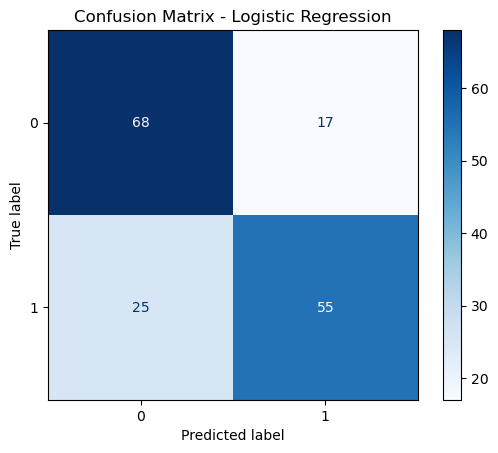

In [52]:
# Compute the confusion matrix for the Logistic Regression model predictions
cm_logreg = confusion_matrix(y_test, logreg_predict_test)

# Create a ConfusionMatrixDisplay object with the computed confusion matrix
disp_logreg = ConfusionMatrixDisplay(confusion_matrix=cm_logreg)

# Plot the confusion matrix using a blue color map ('Blues') and display values as integers
disp_logreg.plot(cmap='Blues', values_format='d')

# Set the title of the plot
plt.title('Confusion Matrix - Logistic Regression')

# Display the plot
plt.show()

### Random Forest Model

In [53]:
# Create a pipeline with TF-IDF Vectorizer and Random Forest Model
pipe_rf = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('rf', RandomForestClassifier(random_state=42))
])

# Define hyperparameter grid for GridSearchCV
param_grid_rf = {
    'tfidf__max_features': [1000, 5000, 10000],
    'tfidf__ngram_range': [(1, 1), (1, 2)],
    'rf__n_estimators': [50, 100, 200],
    'rf__max_depth': [None, 10, 20]
}

# Perform GridSearchCV
grid_search_rf = GridSearchCV(pipe_rf, param_grid_rf, cv=5, n_jobs=-1)
grid_search_rf.fit(X_train_strings, y_train)

# Print the best hyperparameters
print(f'Best hyperparameters: {grid_search_rf.best_params_}')

# Best estimator
best_estimator_rf = grid_search_rf.best_estimator_



Best hyperparameters: {'rf__max_depth': None, 'rf__n_estimators': 200, 'tfidf__max_features': 1000, 'tfidf__ngram_range': (1, 2)}


In [54]:
# Calculate cross-validated accuracy scores for Random Forest
rf_scores = cross_val_score(best_estimator_rf, X_train_strings, y_train, cv=5, scoring="accuracy")

# Fit the Random Forest model to the training data
best_estimator_rf.fit(X_train_strings, y_train)

# Generate cross-validated predictions for the training and test sets
rf_predict_train = cross_val_predict(best_estimator_rf, X_train_strings, y_train, cv=5)
rf_predict_test = cross_val_predict(best_estimator_rf, X_test_strings, y_test, cv=5)

# Print accuracy on the training and test sets, as well as F1 score on the test set for Random Forest
print("RF accuracy on the train set:", round((accuracy_score(y_train, rf_predict_train)), 2))
print("RF accuracy on the test set:", round((accuracy_score(y_test, rf_predict_test)), 2))
print("RF F1 on the test set:", round((f1_score(y_test, rf_predict_test)), 2))

# Generate and print a classification report for the Random Forest model
report_rf = classification_report(y_test, rf_predict_test)
print(report_rf)

RF accuracy on the train set: 0.69
RF accuracy on the test set: 0.64
RF F1 on the test set: 0.7
              precision    recall  f1-score   support

           0       0.76      0.45      0.56        85
           1       0.59      0.85      0.70        80

    accuracy                           0.64       165
   macro avg       0.68      0.65      0.63       165
weighted avg       0.68      0.64      0.63       165



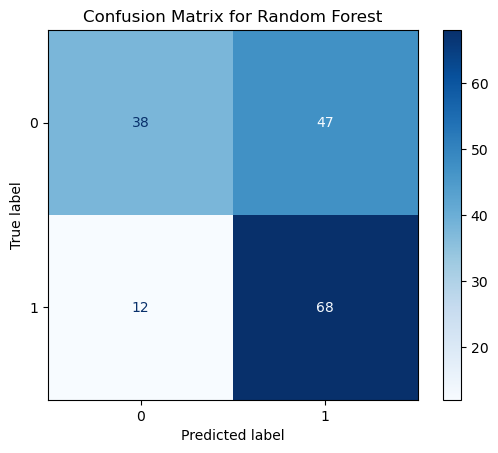

In [55]:
# Compute the confusion matrix for the Random Forest model predictions on the test set
cm_rf = confusion_matrix(y_test, rf_predict_test)

# Create a ConfusionMatrixDisplay object with the computed confusion matrix for Random Forest
disp_rf = ConfusionMatrixDisplay(confusion_matrix=cm_rf)

# Plot the confusion matrix using a blue color map ('Blues') and display values as integers
disp_rf.plot(cmap='Blues', values_format='d')

# Set the title of the plot for the Confusion Matrix of Random Forest
plt.title('Confusion Matrix for Random Forest')

# Display the plot
plt.show()

### Decision Tree Model

In [56]:
# Create a pipeline with TF-IDF Vectorizer and Decision Tree Model
pipe_dt = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('dt', DecisionTreeClassifier(random_state=42))
])

# Define hyperparameter grid for GridSearchCV
param_grid_dt = {
    'tfidf__max_features': [1000, 5000, 10000],
    'tfidf__ngram_range': [(1, 1), (1, 2)],
    'dt__max_depth': [None, 10, 20, 30],
    'dt__min_samples_split': [2, 5, 10],
    'dt__min_samples_leaf': [1, 2, 4]
}

# Perform GridSearchCV
grid_search_dt = GridSearchCV(pipe_dt, param_grid_dt, cv=5, n_jobs=-1)
grid_search_dt.fit(X_train_strings, y_train)

# Print the best hyperparameters
print(f'Best hyperparameters: {grid_search_dt.best_params_}')

# Best estimator
best_estimator_dt = grid_search_dt.best_estimator_



Best hyperparameters: {'dt__max_depth': None, 'dt__min_samples_leaf': 1, 'dt__min_samples_split': 2, 'tfidf__max_features': 5000, 'tfidf__ngram_range': (1, 1)}


In [57]:
# Calculate cross-validated accuracy scores for Decision Tree
dt_scores = cross_val_score(best_estimator_dt, X_train_strings, y_train, cv=5, scoring="accuracy")

# Fit the Decision Tree model to the training data
best_estimator_dt.fit(X_train_strings, y_train)

# Generate cross-validated predictions for the training and test sets
dt_predict_train = cross_val_predict(best_estimator_dt, X_train_strings, y_train, cv=5)
dt_predict_test = cross_val_predict(best_estimator_dt, X_test_strings, y_test, cv=5)

# Print accuracy on the training and test sets, as well as F1 score on the test set for Decision Tree
print("DT accuracy on the train set:", round((accuracy_score(y_train, dt_predict_train)), 2))
print("DT accuracy on the test set:", round((accuracy_score(y_test, dt_predict_test)), 2))
print("DT F1 on the test set:", round((f1_score(y_test, dt_predict_test)), 2))

# Generate and print a classification report for the Decision Tree model
report_dt = classification_report(y_test, dt_predict_test)
print(report_dt)


DT accuracy on the train set: 0.64
DT accuracy on the test set: 0.64
DT F1 on the test set: 0.67
              precision    recall  f1-score   support

           0       0.70      0.51      0.59        85
           1       0.60      0.78      0.67        80

    accuracy                           0.64       165
   macro avg       0.65      0.64      0.63       165
weighted avg       0.65      0.64      0.63       165



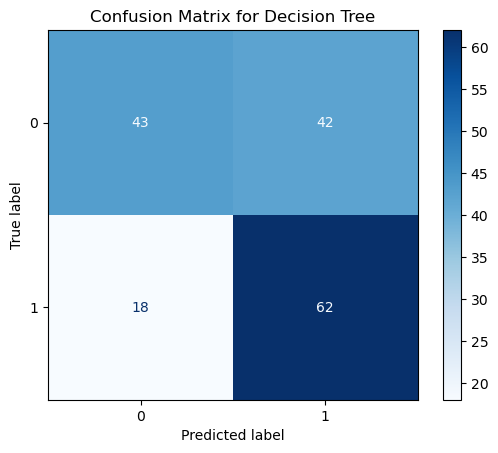

In [58]:
# Compute the confusion matrix for the Decision Tree model predictions on the test set
cm_dt = confusion_matrix(y_test, dt_predict_test)

# Create a ConfusionMatrixDisplay object with the computed confusion matrix for Decision Tree
disp_dt = ConfusionMatrixDisplay(confusion_matrix=cm_dt)

# Plot the confusion matrix using a blue color map ('Blues') and display values as integers
disp_dt.plot(cmap='Blues', values_format='d')

# Set the title of the plot for the Confusion Matrix of Decision Tree
plt.title('Confusion Matrix for Decision Tree')

# Display the plot
plt.show()

### Gradient Boost Model

In [59]:
# Create a pipeline with TF-IDF Vectorizer and Gradient Boost Model
pipe_gb = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('gb', GradientBoostingClassifier(random_state=42))
])

# Define hyperparameter grid for GridSearchCV
param_grid_gb = {
    'tfidf__max_features': [1000, 5000, 10000],
    'tfidf__ngram_range': [(1, 1), (1, 2)],
    'gb__n_estimators': [100, 200, 300],
    'gb__learning_rate': [0.1, 0.01, 0.001],
    'gb__max_depth': [3, 5, 10]
}

# Perform GridSearchCV
grid_search_gb = GridSearchCV(pipe_gb, param_grid_gb, cv=5, n_jobs=-1)
grid_search_gb.fit(X_train_strings, y_train)

# Print the best hyperparameters
print(f'Best hyperparameters: {grid_search_gb.best_params_}')

# Best estimator
best_estimator_gb = grid_search_gb.best_estimator_



Best hyperparameters: {'gb__learning_rate': 0.1, 'gb__max_depth': 10, 'gb__n_estimators': 100, 'tfidf__max_features': 5000, 'tfidf__ngram_range': (1, 1)}


In [60]:
# Best hyperparameters: {'gb__learning_rate': 0.1, 'gb__max_depth': 10, 'gb__n_estimators': 200, 'tfidf__max_features': 5000, 'tfidf__ngram_range': (1, 1)}
gb_scores = cross_val_score(best_estimator_gb, X_train_strings, y_train, cv=5, scoring="accuracy")

best_estimator_gb.fit(X_train_strings, y_train)

gb_predict_train = cross_val_predict(best_estimator_gb,X_train_strings, y_train, cv=5)
gb_predict_test = cross_val_predict(best_estimator_gb, X_test_strings, y_test, cv=5)

# Evaluate the best model on the test set
print("GB accuracy on the train set:", round((accuracy_score(y_train,gb_predict_train)),2))
print("GB accuracy on the test set:", round((accuracy_score(y_test,gb_predict_test)),2))
print("GB F1 on the test set:", round((f1_score(y_test,gb_predict_test)),2))

report_gb = classification_report(y_test, gb_predict_test)
print(report_gb)


GB accuracy on the train set: 0.68
GB accuracy on the test set: 0.68
GB F1 on the test set: 0.66
              precision    recall  f1-score   support

           0       0.68      0.74      0.71        85
           1       0.69      0.62      0.66        80

    accuracy                           0.68       165
   macro avg       0.69      0.68      0.68       165
weighted avg       0.69      0.68      0.68       165



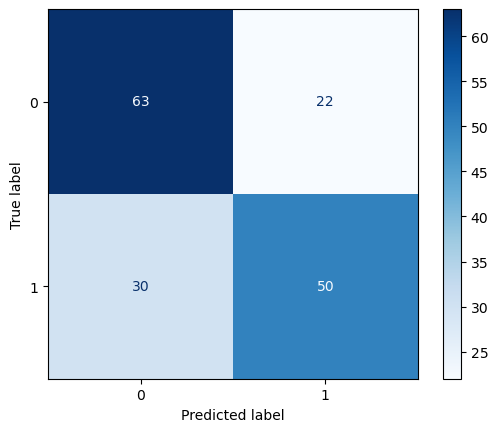

In [61]:
# Compute the confusion matrix for the Gradient Boosting model predictions on the test set
cm_gb = confusion_matrix(y_test, gb_predict_test)

# Create a ConfusionMatrixDisplay object with the computed confusion matrix for Gradient Boosting
disp_gb = ConfusionMatrixDisplay(confusion_matrix=cm_gb)

# Plot the confusion matrix using a blue color map ('Blues') and display values as integers
disp_gb.plot(cmap='Blues', values_format='d')

# Display the plot
plt.show()

### SGDC Classifier

In [62]:
# Create a pipeline with TF-IDF Vectorizer and SGDClassifier
pipe_sgdc = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('sgdc', SGDClassifier(random_state=42))
])

# Define hyperparameter grid for GridSearchCV
param_grid_sgdc = {
    'tfidf__max_features': [1000, 5000, 10000],
    'tfidf__ngram_range': [(1, 1), (1, 2)],
    'sgdc__alpha': [0.0001, 0.001, 0.01, 1],
    'sgdc__loss': ['hinge', 'log'],
    'sgdc__penalty': ['none', 'l2', 'l1', 'elasticnet']
}

# Perform GridSearchCV
grid_search_sgdc = GridSearchCV(pipe_sgdc, param_grid_sgdc, cv=5, n_jobs=-1)
grid_search_sgdc.fit(X_train_strings, y_train)

# Print the best hyperparameters
print(f'Best hyperparameters: {grid_search_sgdc.best_params_}')

# Best estimator
best_estimator_sgdc = grid_search_sgdc.best_estimator_



Best hyperparameters: {'sgdc__alpha': 0.0001, 'sgdc__loss': 'hinge', 'sgdc__penalty': 'l2', 'tfidf__max_features': 5000, 'tfidf__ngram_range': (1, 2)}


In [63]:
# Calculate cross-validated accuracy scores for Stochastic Gradient Descent Classifier (SGDC)
sgdc_scores = cross_val_score(best_estimator_sgdc, X_train_strings, y_train, cv=5, scoring="accuracy")

# Fit the Stochastic Gradient Descent Classifier model to the training data
best_estimator_sgdc.fit(X_train_strings, y_train)

# Generate cross-validated predictions for the training and test sets
sgdc_predict_train = cross_val_predict(best_estimator_sgdc, X_train_strings, y_train, cv=5)
sgdc_predict_test = cross_val_predict(best_estimator_sgdc, X_test_strings, y_test, cv=5)

# Print accuracy on the training and test sets, as well as F1 score on the test set for Stochastic Gradient Descent Classifier
print("SGDC accuracy on the train set:", round((accuracy_score(y_train, sgdc_predict_train)), 2))
print("SGDC accuracy on the test set:", round((accuracy_score(y_test, sgdc_predict_test)), 2))
print("SGDC F1 on the test set:", round((f1_score(y_test, sgdc_predict_test)), 2))

# Generate and print a classification report for the Stochastic Gradient Descent Classifier model
report_sgdc = classification_report(y_test, sgdc_predict_test)
print(report_sgdc)

SGDC accuracy on the train set: 0.71
SGDC accuracy on the test set: 0.74
SGDC F1 on the test set: 0.73
              precision    recall  f1-score   support

           0       0.74      0.76      0.75        85
           1       0.74      0.71      0.73        80

    accuracy                           0.74       165
   macro avg       0.74      0.74      0.74       165
weighted avg       0.74      0.74      0.74       165



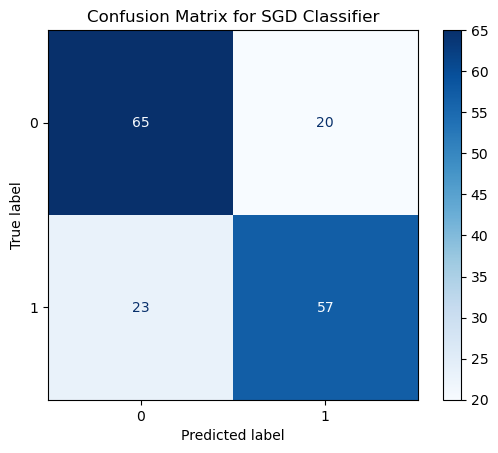

In [64]:
# Compute the confusion matrix for the SGD Classifier model predictions on the test set
cm_sgdc = confusion_matrix(y_test, sgdc_predict_test)

# Create a ConfusionMatrixDisplay object with the computed confusion matrix for SGD Classifier
disp_sgdc = ConfusionMatrixDisplay(confusion_matrix=cm_sgdc)

# Plot the confusion matrix using a blue color map ('Blues') and display values as integers
disp_sgdc.plot(cmap='Blues', values_format='d')

# Set the title of the plot for the Confusion Matrix of SGD Classifier
plt.title('Confusion Matrix for SGD Classifier')

# Display the plot
plt.show()

- As seen above, the best model so far was multinomial naive bayes model for predicting negative sentiments with an accuracy of 75%. 

## Recommendation

- Based on the word clouds we suggest that apple's marketing and product development team focus on battery life, ensure ipad design with a slim profile and varied colors and enhance external communication.


## Future Steps 

- expand choices beyond the base model:
    - price, colors, size, etc.


- focus on customer relationship 
    -  communications


- obtain more recent data
- use different sources of sentiments: 
    - platform X and threads